# Sanity check for trained model 
- load a saved model
- make a tiny test dataset with 10 examples from each class
- make predictions on these test examples
- display the spectrograms, audio and model prediction for each of the examples. 

This report shows the model's prediction vs. ground truth for a few examples. In the examples, the Olive Sided Flycatcher (OSFL) is either __present__ or __absent__

- __Present__ - The 3s clip of audio contains a complete human labelled tag of the OSFL. 
- __Absent__ - The example is audio taken from before the start of a human labelled OSFL tag. 

The scores are made on a validation set, which is defined as 
- The unseen audio from 20% of the ARU locations in the training set. The model has not been trained on audio from these locations. 

#### There is some further processing which need to be applied to this dataset:
- __Mix in audio from other times of day, and other habitats__. This is to ensure that the training data contains as much variety as possible. 
- __Replace the human labelled audio samples with high scoring ones picked out by HawkEars model__ - these should end up all being focal recordings. This is assumed to produce a relationsip between sound power and recognizer score. This will enable density estimation and other downstream statistical applications. 
- __bandpass the input signal__ to remove sounds from frequencies outside the OSFL vocalization range
- Go through the audio samples in the validation set and remove any which are obviously labelled incorrectly, and flag those which are borderline.

In [1]:
# imports
from pathlib import Path
import pandas as pd
import sys
BASE_PATH = Path.cwd().parent.parent
sys.path.append(str(BASE_PATH))
import pandas as pd
import opensoundscape as opso
from opensoundscape import Audio, Spectrogram
import numpy as np


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:18: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
# Load the validation set
train_valid_set_path = BASE_PATH / 'data' / 'interim' / 'train_and_valid_set' 
valid_set = pd.read_pickle(train_valid_set_path / 'valid_ds_sample_size_0.1.pkl')
valid_set.sample(5)

,,,target_presence,target_absence
file,start_time,end_time,,
../../data/raw/recordings/OSFL/recording-186920.mp3,3.0,6.0,0.0,1.0
../../data/raw/recordings/OSFL/recording-816783.flac,43.5,46.5,0.0,1.0
../../data/raw/recordings/OSFL/recording-4819.mp3,4.5,7.5,0.0,1.0
../../data/raw/recordings/OSFL/recording-169644.flac,54.0,57.0,0.0,1.0
../../data/raw/recordings/OSFL/recording-330530.flac,102.0,105.0,0.0,1.0


In [3]:
# Take a sample of 10 from each class
present_samples = valid_set.loc[valid_set['target_presence']==1].sample(10)
absent_samples = valid_set.loc[valid_set['target_absence']==1].sample(10)
present_samples.index[0]

(PosixPath('../../data/raw/recordings/OSFL/recording-816783.flac'), 52.5, 55.5)

In [4]:
# Load a trained model. 
model = opso.cnn.load_model(BASE_PATH / 'models' / 'best.model')
model.valid_metrics

{0: {'confusion_matrix': array([[ 914,   69],
         [8978, 1541]]),
  'precision': 0.9571428571428572,
  'recall': 0.1464968152866242,
  'f1': 0.2541017396322862,
  'jaccard': 0.11864998939763832,
  'hamming_loss': 0.7865588593288124},
 1: {'confusion_matrix': array([[ 948,   35],
         [9303, 1216]]),
  'precision': 0.9720223820943246,
  'recall': 0.11560034223785531,
  'f1': 0.20662701784197113,
  'jaccard': 0.10369054294846008,
  'hamming_loss': 0.8118588071639715},
 2: {'confusion_matrix': array([[ 914,   69],
         [6383, 4136]]),
  'precision': 0.9835909631391201,
  'recall': 0.3931932693221789,
  'f1': 0.5618038576473784,
  'jaccard': 0.2573572651932767,
  'hamming_loss': 0.5609459224482699},
 3: {'confusion_matrix': array([[ 890,   93],
         [4288, 6231]]),
  'precision': 0.9852941176470589,
  'recall': 0.5923566878980892,
  'f1': 0.7398919432405153,
  'jaccard': 0.37800694445487304,
  'hamming_loss': 0.3808902799513128},
 4: {'confusion_matrix': array([[ 813,  170

In [5]:
valid_set_preds = model.predict(valid_set, batch_size=32)

  0%|          | 0/51 [00:00<?, ?it/s]

# Important 
Swap the order of the columns if necessary so that absent is at index 0 and present is at index 1 to make the confusion matrix display correctly. 


In [6]:
valid_set = valid_set[["target_absence", "target_presence"]]
valid_set_preds = valid_set_preds[["target_absence", "target_presence"]]

# Sigmoid or Softmax activation?
### Softmax activation
- Advantage : Softmax output would mean we can easily combine both class predictions into one number - since both classes will sum to 1, the absence can be calculated from the presence score. 
- Disadvantage 1: The outputs of softmax activation get strongly transformed and become artificially close to 0 or 1. This means that the shape of the score vs. sound power level curve might get squashed into a narrower range of possible values compared with sigmoid activation. 
- Disadvantage 2: Additionally the highest scoring samples might fall off the bottom of the floating point precision for 32 bit floating point numbers - and we can see this happening in the example below. 

### Sigmoid activation
- Advantage: The output scores are less strongly transformed than in the softmax case, and they tend to spread across a wider range of numbers between 0 and 1. 
- Disadvantage: The output is in the form of 2 numbers. Choosing to only display the score for target presence won't tell the whole story since it is the relative level of confidence of the present and absent classes which decides the final prediction.  

In [7]:
# Example sigmoid outputs
present_preds = model.predict(present_samples, activation_layer='sigmoid')
absent_preds = model.predict(absent_samples, activation_layer='sigmoid')
present_preds

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

,,,target_presence,target_absence
file,start_time,end_time,,
../../data/raw/recordings/OSFL/recording-816783.flac,52.5,55.5,0.995329,0.003574
../../data/raw/recordings/OSFL/recording-104311.mp3,6.0,9.0,0.999628,0.000335
../../data/raw/recordings/OSFL/recording-312412.mp3,84.0,87.0,0.519209,0.462353
../../data/raw/recordings/OSFL/recording-554028.flac,24.0,27.0,0.985268,0.011027
../../data/raw/recordings/OSFL/recording-186920.mp3,6.0,9.0,0.988499,0.011426
../../data/raw/recordings/OSFL/recording-826374.flac,3.0,6.0,0.096868,0.910009
../../data/raw/recordings/OSFL/recording-104311.mp3,7.5,10.5,0.999755,0.000193
../../data/raw/recordings/OSFL/recording-292812.mp3,12.0,15.0,0.991851,0.006037
../../data/raw/recordings/OSFL/recording-295267.mp3,39.0,42.0,0.999226,0.000625


In [8]:
# Example softmax outputs
present_preds = model.predict(present_samples, activation_layer='softmax')
absent_preds = model.predict(absent_samples, activation_layer='softmax')
present_preds

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

,,,target_presence,target_absence
file,start_time,end_time,,
../../data/raw/recordings/OSFL/recording-816783.flac,52.5,55.5,0.999983,1.683458e-05
../../data/raw/recordings/OSFL/recording-104311.mp3,6.0,9.0,1.000000,1.246052e-07
../../data/raw/recordings/OSFL/recording-312412.mp3,84.0,87.0,0.556692,4.433077e-01
../../data/raw/recordings/OSFL/recording-554028.flac,24.0,27.0,0.999833,1.666872e-04
../../data/raw/recordings/OSFL/recording-186920.mp3,6.0,9.0,0.999866,1.344499e-04
../../data/raw/recordings/OSFL/recording-826374.flac,3.0,6.0,0.010495,9.895046e-01
../../data/raw/recordings/OSFL/recording-104311.mp3,7.5,10.5,1.000000,4.731115e-08
../../data/raw/recordings/OSFL/recording-292812.mp3,12.0,15.0,0.999950,4.990049e-05
../../data/raw/recordings/OSFL/recording-295267.mp3,39.0,42.0,1.000000,4.842599e-07


In [9]:
# rename columns for better clarity after they're combined
present_samples.rename(columns = {'target_presence':'present_label', 'target_absence':'absent_label'}, inplace = True) 
present_preds.rename(columns = {'target_presence':'present_pred', 'target_absence':'absent_pred'}, inplace = True)
absent_samples.rename(columns = {'target_presence':'present_label', 'target_absence':'absent_label'}, inplace = True)
absent_preds.rename(columns = {'target_presence':'present_pred', 'target_absence':'absent_pred'}, inplace = True)

# combine labels and predictions for samples of present and absent classes
present_labels_and_preds = pd.concat([present_samples, present_preds], axis=1)
absent_labels_and_preds = pd.concat([absent_samples, absent_preds], axis=1)
combined = pd.concat([present_labels_and_preds, absent_labels_and_preds], axis=0)
combined = combined[["absent_label", "present_label", "absent_pred", "present_pred"]] # This is to make the confusion matrix work. 
combined

,,,absent_label,present_label,absent_pred,present_pred
file,start_time,end_time,,,,
../../data/raw/recordings/OSFL/recording-816783.flac,52.5,55.5,0.0,1.0,1.683458e-05,0.999983
../../data/raw/recordings/OSFL/recording-104311.mp3,6.0,9.0,0.0,1.0,1.246052e-07,1.000000
../../data/raw/recordings/OSFL/recording-312412.mp3,84.0,87.0,0.0,1.0,4.433077e-01,0.556692
../../data/raw/recordings/OSFL/recording-554028.flac,24.0,27.0,0.0,1.0,1.666872e-04,0.999833
../../data/raw/recordings/OSFL/recording-186920.mp3,6.0,9.0,0.0,1.0,1.344499e-04,0.999866
../../data/raw/recordings/OSFL/recording-826374.flac,3.0,6.0,0.0,1.0,9.895046e-01,0.010495
../../data/raw/recordings/OSFL/recording-104311.mp3,7.5,10.5,0.0,1.0,4.731115e-08,1.000000
../../data/raw/recordings/OSFL/recording-292812.mp3,12.0,15.0,0.0,1.0,4.990049e-05,0.999950
../../data/raw/recordings/OSFL/recording-295267.mp3,39.0,42.0,0.0,1.0,4.842599e-07,1.000000


In [10]:
def show_example(counter):
    path, offset, end_time = combined.index[counter]
    duration = end_time - offset
    audio = Audio.from_file(path, offset=offset, duration=duration)
    spectrogram = Spectrogram.from_audio(audio)
    print(path, offset, end_time)
    print(audio.metadata)
    print(f"Present Prediction = {combined.iloc[counter].present_pred} \nActual = {combined.iloc[counter].present_label}")
    print("Check below")
    audio.show_widget()
    spectrogram.plot()
    counter += 1
    return counter


# Show Predictions
See example labels, predictions, audio and spectrograms below

In [11]:
next_example_idx = 0

../../data/raw/recordings/OSFL/recording-816783.flac 52.5 55.5
{'comment': 'Processed by SoX', 'samplerate': 32000, 'format': 'FLAC', 'frames': 5760128, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9999831914901733 
Actual = 1.0
Check below


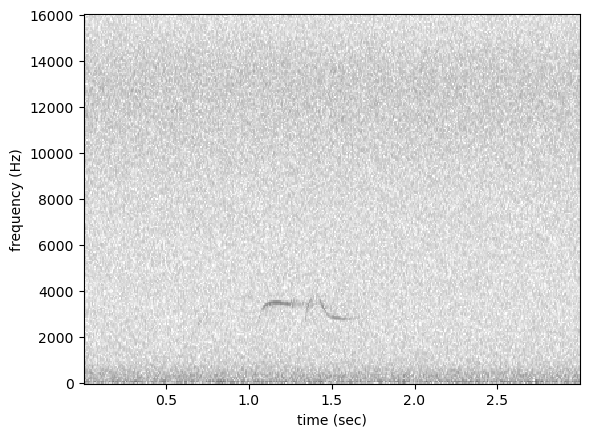

In [12]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-104311.mp3 6.0 9.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7937792, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9999998807907104 
Actual = 1.0
Check below


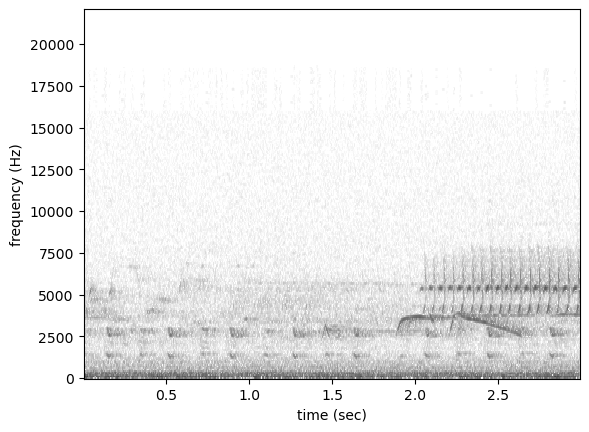

In [13]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-312412.mp3 84.0 87.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 13258843, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.5566922426223755 
Actual = 1.0
Check below


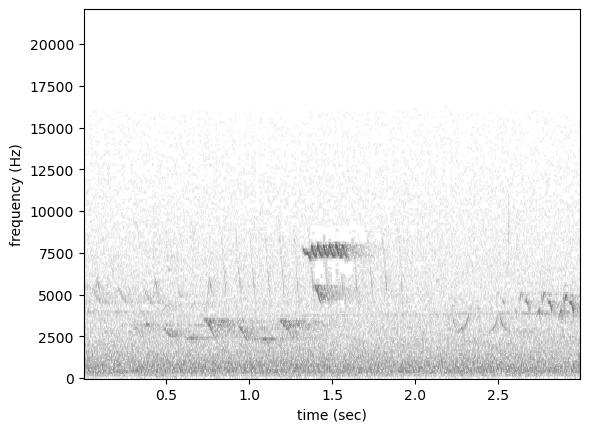

In [14]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-554028.flac 24.0 27.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9998332262039185 
Actual = 1.0
Check below


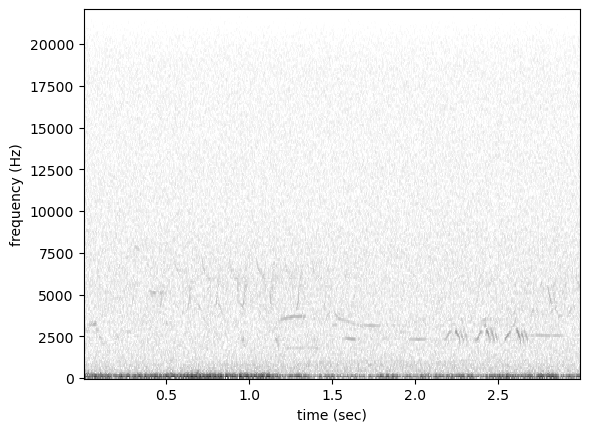

In [15]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-186920.mp3 6.0 9.0
{'samplerate': 24000, 'format': 'MP3', 'frames': 7201152, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9998655319213867 
Actual = 1.0
Check below


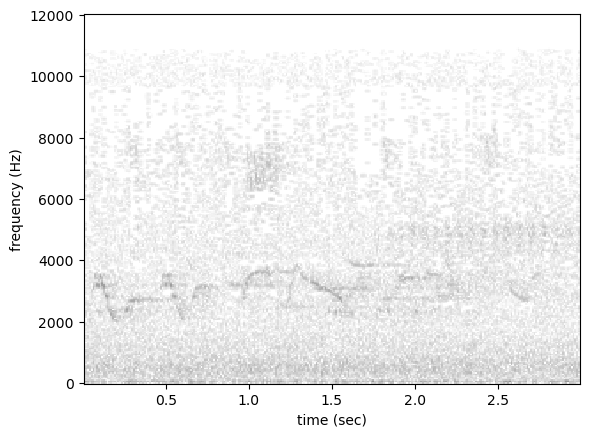

In [16]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-826374.flac 3.0 6.0
{'comment': 'Processed by SoX', 'samplerate': 32000, 'format': 'FLAC', 'frames': 5760000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.010495387949049473 
Actual = 1.0
Check below


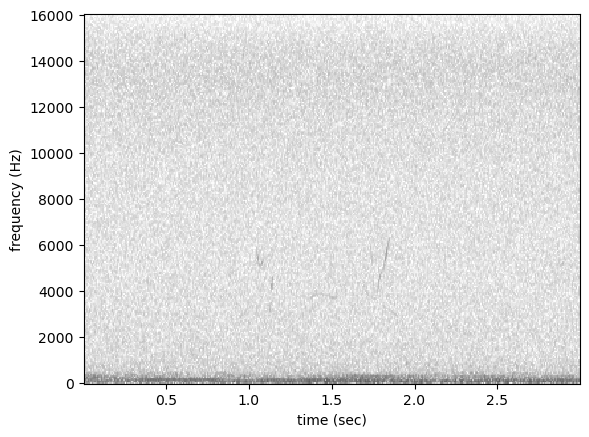

In [17]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-104311.mp3 7.5 10.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 7937792, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 1.0 
Actual = 1.0
Check below


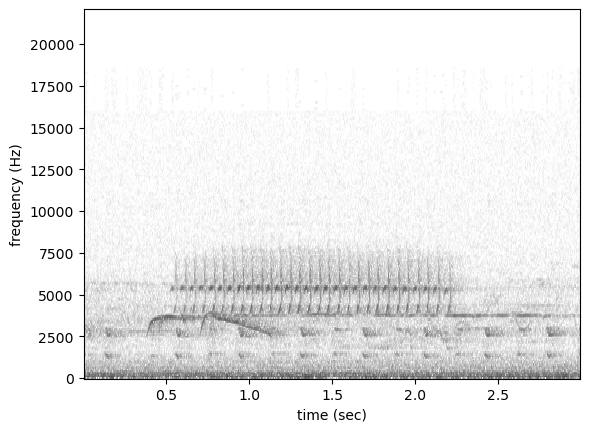

In [18]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292812.mp3 12.0 15.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9999500513076782 
Actual = 1.0
Check below


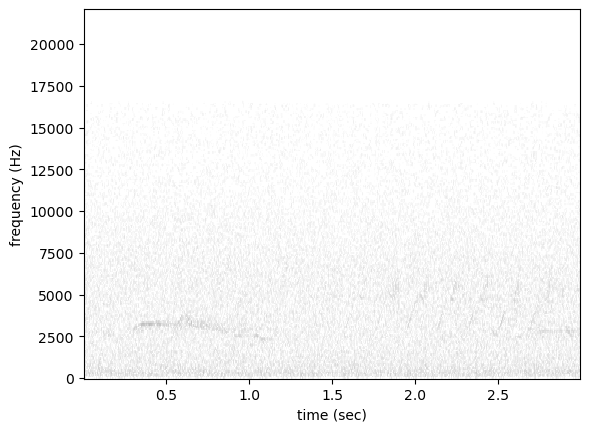

In [19]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-295267.mp3 39.0 42.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9999995231628418 
Actual = 1.0
Check below


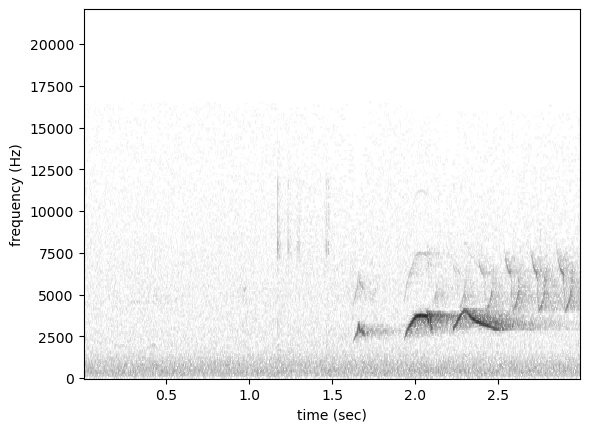

In [20]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-293174.mp3 0.0 3.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 1.0 
Actual = 1.0
Check below


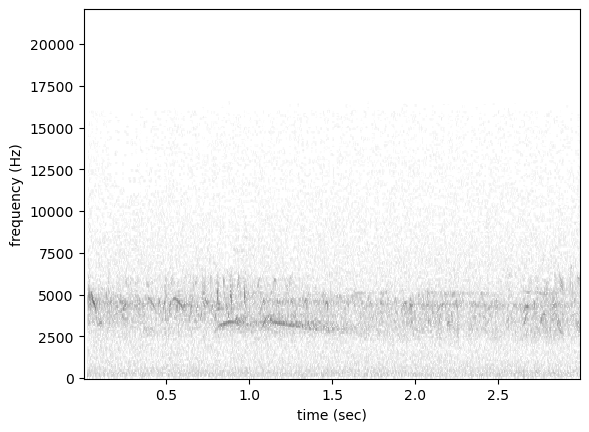

In [21]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-291508.mp3 172.5 175.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.0005287313251756132 
Actual = 0.0
Check below


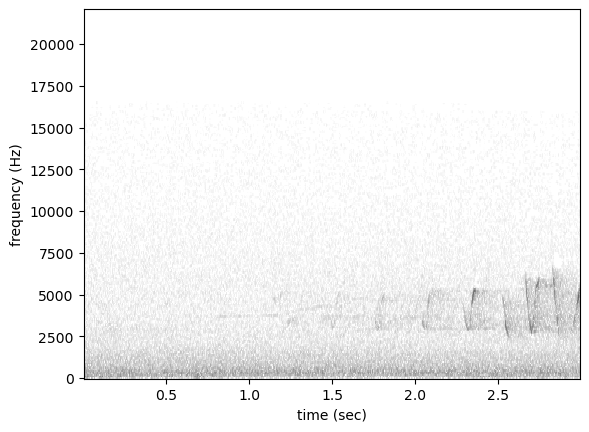

In [22]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-293060.mp3 0.0 3.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9960401058197021 
Actual = 0.0
Check below


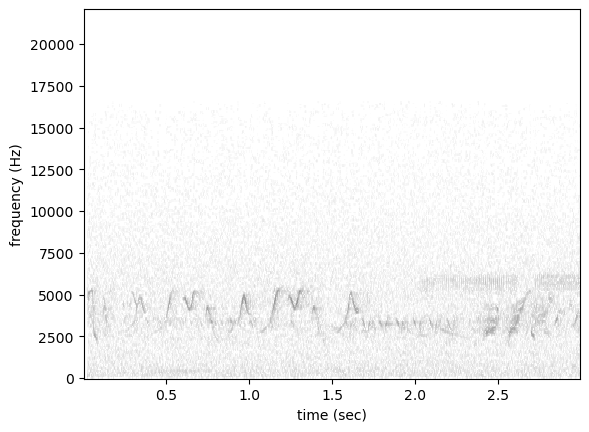

In [23]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-816783.flac 10.5 13.5
{'comment': 'Processed by SoX', 'samplerate': 32000, 'format': 'FLAC', 'frames': 5760128, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.008479059673845768 
Actual = 0.0
Check below


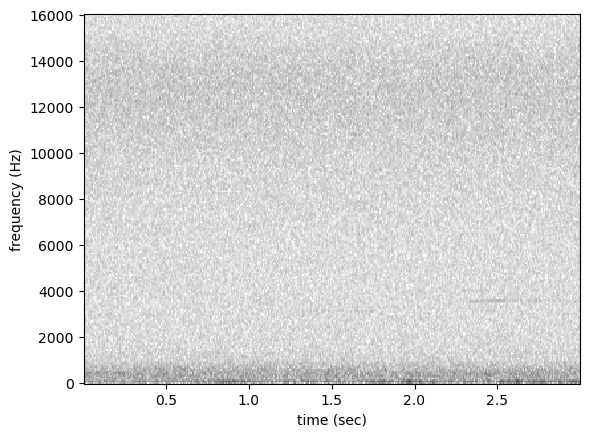

In [24]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-815882.flac 30.0 33.0
{'comment': 'Processed by SoX', 'samplerate': 32000, 'format': 'FLAC', 'frames': 19200000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.0032304711639881134 
Actual = 0.0
Check below


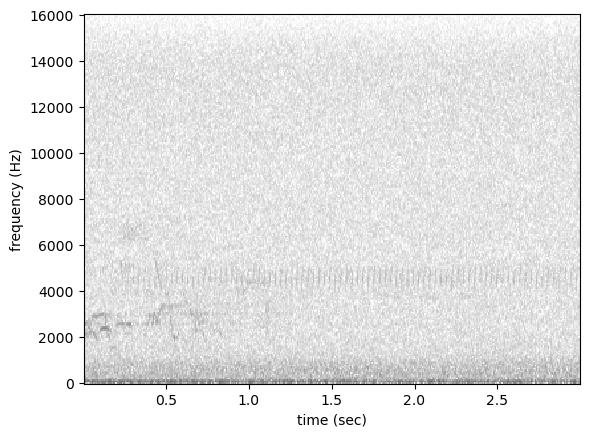

In [25]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-553491.flac 18.0 21.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.00020797309116460383 
Actual = 0.0
Check below


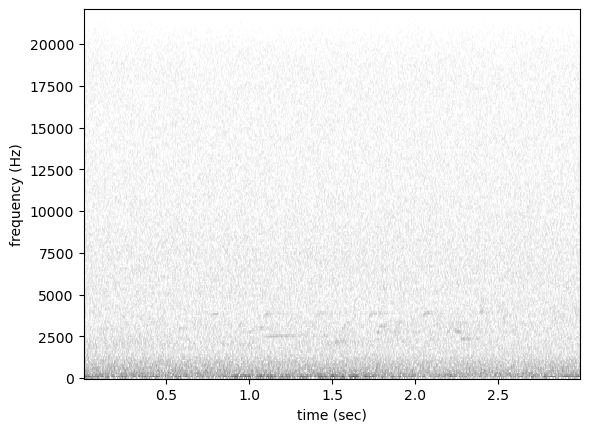

In [26]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-552659.flac 9.0 12.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13229824, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.9999958276748657 
Actual = 0.0
Check below


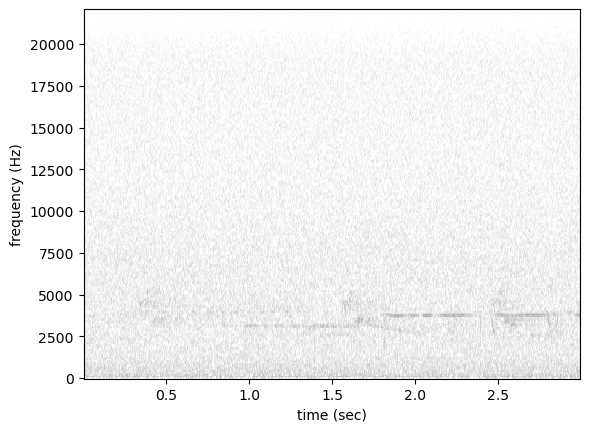

In [27]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-330530.flac 22.5 25.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.0013140597147867084 
Actual = 0.0
Check below


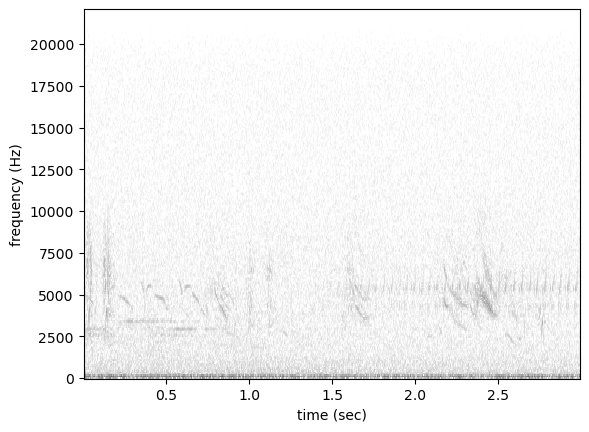

In [28]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-826279.flac 1.5 4.5
{'comment': 'Processed by SoX', 'samplerate': 32000, 'format': 'FLAC', 'frames': 5760000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.004810658283531666 
Actual = 0.0
Check below


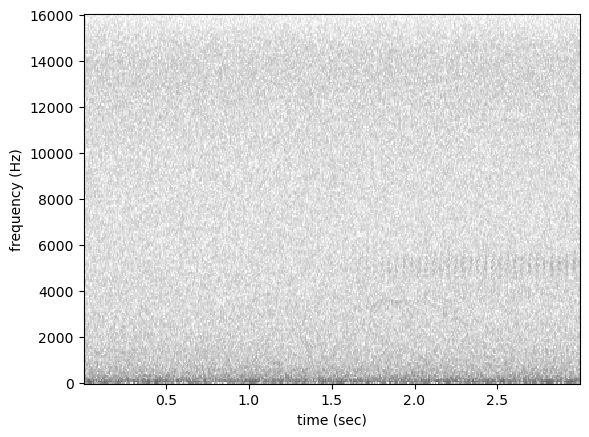

In [29]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-4819.mp3 18.0 21.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7937792, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.0025365599431097507 
Actual = 0.0
Check below


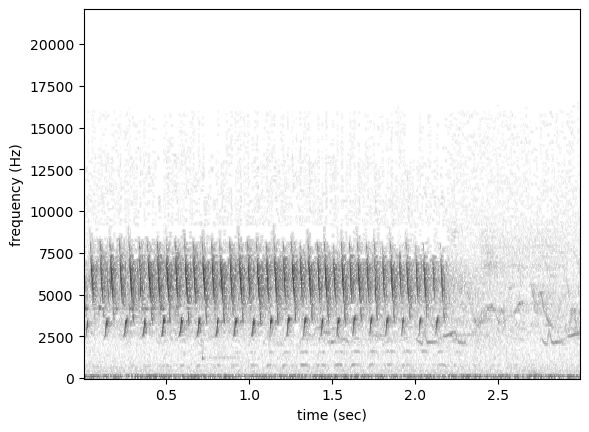

In [30]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-330530.flac 40.5 43.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Present Prediction = 0.006636050529778004 
Actual = 0.0
Check below


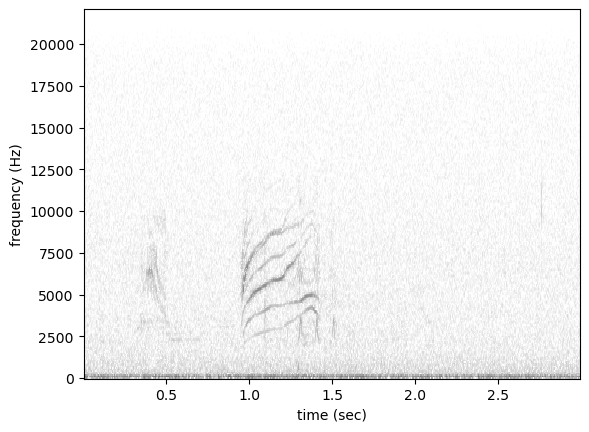

In [31]:
next_example_idx = show_example(next_example_idx)

# Check that the confusion matrix is working properly.

Here's the function which calculates the metrics. 


``` py
def single_target_metrics(targets, scores):
    """generate various metrics for a set of scores and labels (targets)

    Predicts 1 for the highest scoring class per sample and 0 for
    all other classes.

    Args:
        targets: 0/1 lables in 2d array
        scores: continuous values in 2d array

    Returns:
        metrics_dict: dictionary of various overall and per-class metrics

    """
    if max(np.sum(targets, 1)) > 1:
        raise ValueError(
            "Labels were not single target! "
            "Use multi-target classifier if multiple classes can be present "
            "in a single sample."
        )

    metrics_dict = {}

    preds = predict_single_target_labels(scores=scores)

    # Confusion matrix requires numbered-class not one-hot labels
    t = np.argmax(targets, 1)
    p = np.argmax(preds, 1)
    metrics_dict["confusion_matrix"] = M.confusion_matrix(t, p)

    # precision, recall, and f1
    pre, rec, f1, _ = M.precision_recall_fscore_support(
        targets, preds, average=None, zero_division=0
    )
    metrics_dict.update({"precision": pre[1], "recall": rec[1], "f1": f1[1]})

    try:
        metrics_dict["jaccard"] = M.jaccard_score(targets, preds, average="macro")
    except ValueError:
        metrics_dict["jaccard"] = np.nan
    try:
        metrics_dict["hamming_loss"] = M.hamming_loss(targets, preds)
    except ValueError:
        metrics_dict["hamming_loss"] = np.nan

    return metrics_dict
    ```

In [32]:
sample_targets = combined[["absent_label", "present_label"]]
sample_scores = combined[["absent_pred", "present_pred"]]
opso.metrics.single_target_metrics(sample_targets, sample_scores)


{'confusion_matrix': array([[8, 2],
        [1, 9]]),
 'precision': 0.8181818181818182,
 'recall': 0.9,
 'f1': 0.8571428571428572,
 'jaccard': 0.7386363636363636,
 'hamming_loss': 0.15}

In [33]:
np.argmax(sample_targets, axis=1),np.argmax(sample_scores, axis=1)

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array([1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]))

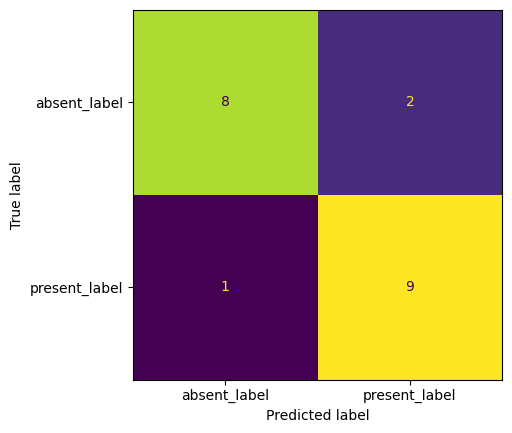

In [34]:
opso.metrics.M.ConfusionMatrixDisplay.from_predictions(np.argmax(sample_targets,1), np.argmax(sample_scores,1),display_labels = sample_targets.columns, colorbar=False)

In [35]:
model.classes

['target_presence', 'target_absence']

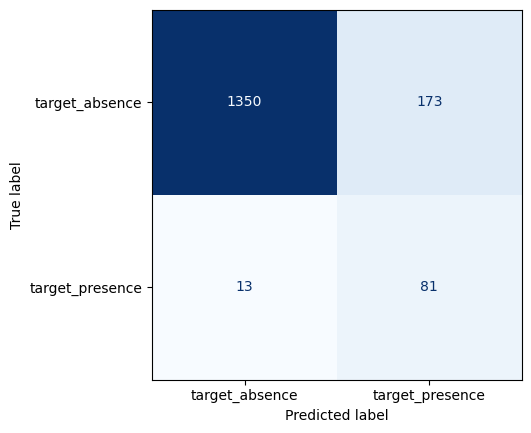

In [36]:
cm = opso.metrics.M.confusion_matrix(np.argmax(valid_set, 1), np.argmax(valid_set_preds, 1))
opso.metrics.M.ConfusionMatrixDisplay(cm, display_labels=valid_set.columns).plot(cmap='Blues', colorbar=False)

In [37]:
opso.metrics.single_target_metrics(valid_set, valid_set_preds)

{'confusion_matrix': array([[1350,  173],
        [  13,   81]]),
 'precision': 0.3188976377952756,
 'recall': 0.8617021276595744,
 'f1': 0.4655172413793103,
 'jaccard': 0.591138518258427,
 'hamming_loss': 0.1150278293135436}

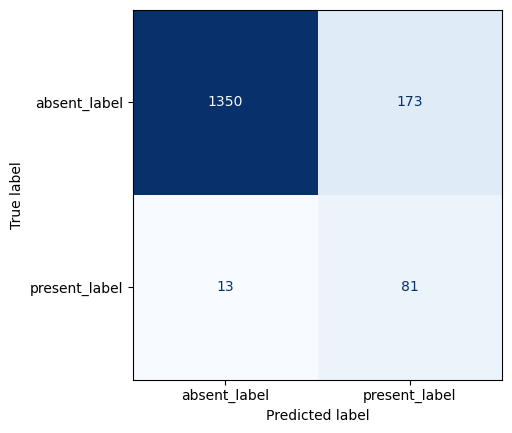

In [38]:
opso.metrics.M.ConfusionMatrixDisplay.from_predictions(np.argmax(valid_set,1), np.argmax(valid_set_preds,1),display_labels = sample_targets.columns, cmap="Blues", colorbar=False)

In [39]:
model.valid_metrics

{0: {'confusion_matrix': array([[ 914,   69],
         [8978, 1541]]),
  'precision': 0.9571428571428572,
  'recall': 0.1464968152866242,
  'f1': 0.2541017396322862,
  'jaccard': 0.11864998939763832,
  'hamming_loss': 0.7865588593288124},
 1: {'confusion_matrix': array([[ 948,   35],
         [9303, 1216]]),
  'precision': 0.9720223820943246,
  'recall': 0.11560034223785531,
  'f1': 0.20662701784197113,
  'jaccard': 0.10369054294846008,
  'hamming_loss': 0.8118588071639715},
 2: {'confusion_matrix': array([[ 914,   69],
         [6383, 4136]]),
  'precision': 0.9835909631391201,
  'recall': 0.3931932693221789,
  'f1': 0.5618038576473784,
  'jaccard': 0.2573572651932767,
  'hamming_loss': 0.5609459224482699},
 3: {'confusion_matrix': array([[ 890,   93],
         [4288, 6231]]),
  'precision': 0.9852941176470589,
  'recall': 0.5923566878980892,
  'f1': 0.7398919432405153,
  'jaccard': 0.37800694445487304,
  'hamming_loss': 0.3808902799513128},
 4: {'confusion_matrix': array([[ 813,  170

The precision calculation from sklearn should be ordered like this. 

![Screenshot 2024-02-27 at 11.51.53.png](<attachment:Screenshot 2024-02-27 at 11.51.53.png>)
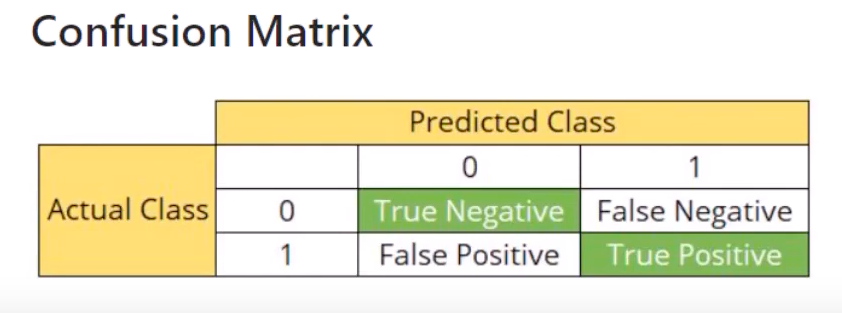

In [40]:
np.argmax(sample_targets, 1), np.argmax(sample_scores, 1)

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 array([1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0]))

In [41]:
tn, fp, fn, tp = opso.metrics.M.confusion_matrix(np.argmax(sample_targets, 1), np.argmax(sample_scores, 1)).ravel()
tn, fp, fn, tp

(8, 2, 1, 9)

In [42]:
precision = tp / (tp + fp)
precision

0.8181818181818182

In [43]:
opso.metrics.M.confusion_matrix(np.argmax(sample_targets, 1), np.argmax(sample_scores, 1))

array([[8, 2],
       [1, 9]])

Predicted Class [0, 1] <br>
Actual Class 0 [TN, FN] <br>
Actual Class 1 [FP, TP]

# Conclusion
In this notebook I found that the order of the classes is important - during model training, the absent class must be at index 0 and the present class must be at index 1 otherwise the confusion matrix and calculations won't be correct. 

Further work for this notebook:

1. show confusion matrix Done
2. plot the examples with the highest losses. 